# Implementacion del algoritmo CLR

> Recomendaciones
* Para las variables binarias no se requiere hacer codificacion one - hot
* Probar con el regresor ElasticNet y verificar si efectivanete elimina variables colineales en cada grupo.
* Investigar un regresor que elimine la colinealidad entre variables.
* Modificar el concepto de error promedio aceptado.
* Modificar el numero minimo de regristros por grupo, al menor el 10% de los datos, registros minimos.
* Seleccionar un error promedio aceptado Correcto.

In [1]:
# Dependencias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import model_selection
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import ElasticNet
from math import sqrt
from sklearn.metrics import r2_score
from sklearn.linear_model import LassoCV
from numpy import mean
from numpy import std
from numpy import arange
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

In [3]:
# Cargue de los datos | informacion
df = pd.read_excel("../Archivos Generados/DatasetFinal.xlsx")

In [4]:
# Se muestra los primeros 5 elementos
df.head(5)

,ID_LOTE,TIPO_SIEMBRA,SEM_TRATADAS,MATERIAL_GENETICO,CULT_ANT,DRENAJE,METODO_COSECHA,ALMACENAMIENTO_FINCA,DIAS_EN_EMERGER,DIAS_EN_EMERGER_A_FLORECER,...,Temp_Max_Avg_Mad,Temp_Min_Avg_Mad,Temp_Avg_Mad,Diurnal_Range_Avg_Mad,Sol_Ener_Accu_Mad,Temp_Max_34_Freq_Mad,Rain_Accu_Mad,Rain_10_Freq_Mad,Rhum_Avg_Mad,RDT_AJUSTADO
0,40,Mecanizado,NO,PIONEER 30F32,Algodon,SI,Manual,NO,5,63,...,32.05,23.60,27.83,8.45,13197.57,0.05,279.3,0.23,82.41,4767.44
1,43,Mecanizado,SI,DK 234,Maiz,SI,Manual,NO,5,64,...,32.37,23.49,27.93,8.89,12436.49,0.03,221.2,0.26,81.86,4651.16
2,44,Mecanizado,NO,PIONEER 30F32,Algodon,SI,Manual,NO,5,59,...,32.17,23.53,27.85,8.63,11267.17,0.03,226.0,0.27,82.61,5180.23
3,45,Mecanizado,NO,Otro,Algodon,SI,Manual,NO,5,64,...,32.19,23.54,27.86,8.65,11066.68,0.03,223.2,0.29,81.84,4897.67
4,46,Mecanizado,NO,Otro,Algodon,SI,Manual,NO,5,63,...,32.19,23.54,27.86,8.65,11066.68,0.03,223.2,0.29,81.84,5302.33


In [5]:
# Selección de las variables categoricas
cat_features = df.select_dtypes(include = ["object", "category"]).columns
print("Cantidad de variables categoricas: ", len(cat_features))
cat_features

Cantidad de variables categoricas:  30


Index(['TIPO_SIEMBRA', 'SEM_TRATADAS', 'MATERIAL_GENETICO', 'CULT_ANT',
       'DRENAJE', 'METODO_COSECHA', 'ALMACENAMIENTO_FINCA',
       'TERRENO_CIRCUN_RASTA', 'POSICION_PERFIL_RASTA', 'PEDREG_PERFIL_ROCAS',
       'CAP_ENDURE_RASTA', 'MOTEADOS_RASTA', 'MOTEADOS_MAS70cm._RASTA',
       'ESTRUCTURA_RASTA', 'OBSERVA_EROSION_RASTA', 'OBSERVA_MOHO_RASTA',
       'OBSERVA_COSTRAS_DURAS_RASTA', 'SITIO_EXPUESTO_SOL_RASTA',
       'OBSERVA_COSTRAS_BLANCAS_RASTA', 'OBSERVA_COSTAS_NEGRAS_RASTA',
       'REGION_SECA_ARIDA_RASTA', 'OBSERVA_RAICES_VIVAS_RASTA',
       'OBSERVA_PLANTAS_PEQUENAS_RASTA', 'OBSERVA_HOJARASCA_MO_RASTA',
       'SUELO_NEGRO_BLANDO_RASTA', 'CUCHILLO_PRIMER_HTE_RASTA',
       'CERCA_RIOS_QUEBRADAS_RASTA', 'RECUBRIMIENTO_VEGETAL__SUELO_RASTA',
       'd.interno', 'drenaje_externo'],
      dtype='object')

In [6]:
# Seleccion de variables Binarias.
bin_features =['SEM_TRATADAS','DRENAJE','ALMACENAMIENTO_FINCA','CAP_ENDURE_RASTA','MOTEADOS_RASTA','MOTEADOS_MAS70cm._RASTA',
               'OBSERVA_EROSION_RASTA','OBSERVA_MOHO_RASTA','OBSERVA_RAICES_VIVAS_RASTA','OBSERVA_HOJARASCA_MO_RASTA',
                'SUELO_NEGRO_BLANDO_RASTA','CUCHILLO_PRIMER_HTE_RASTA','CERCA_RIOS_QUEBRADAS_RASTA',
               ]
print("Cantidad de variables binarias: ",len(bin_features))               

Cantidad de variables binarias:  13


In [7]:
# Codificacion Dataset de caracteristicas binarias
bin_dataset = df[bin_features].replace({'SI': 1, 'NO': 0})

In [8]:
# Visualizacion Dataset de caracteristicas binarias
bin_dataset.head(5)

,SEM_TRATADAS,DRENAJE,ALMACENAMIENTO_FINCA,CAP_ENDURE_RASTA,MOTEADOS_RASTA,MOTEADOS_MAS70cm._RASTA,OBSERVA_EROSION_RASTA,OBSERVA_MOHO_RASTA,OBSERVA_RAICES_VIVAS_RASTA,OBSERVA_HOJARASCA_MO_RASTA,SUELO_NEGRO_BLANDO_RASTA,CUCHILLO_PRIMER_HTE_RASTA,CERCA_RIOS_QUEBRADAS_RASTA
0,0,1,0,0,1,0,0,0,0,0,0,1,0
1,1,1,0,1,1,0,0,0,0,1,0,1,0
2,0,1,0,1,1,0,0,0,1,1,0,1,0
3,0,1,0,1,1,0,0,0,0,1,0,0,0
4,0,1,0,1,1,0,0,0,0,1,0,0,0


In [9]:
# Longitud de las variables categoricas
len(cat_features)
# Se eliminar variables binarias de la lista de categoricas.
categorical_features = [x for x in cat_features if x not in bin_features]
print("variables Categoricas", len(categorical_features))

variables Categoricas 17


In [10]:
categorical_features

['TIPO_SIEMBRA',
 'MATERIAL_GENETICO',
 'CULT_ANT',
 'METODO_COSECHA',
 'TERRENO_CIRCUN_RASTA',
 'POSICION_PERFIL_RASTA',
 'PEDREG_PERFIL_ROCAS',
 'ESTRUCTURA_RASTA',
 'OBSERVA_COSTRAS_DURAS_RASTA',
 'SITIO_EXPUESTO_SOL_RASTA',
 'OBSERVA_COSTRAS_BLANCAS_RASTA',
 'OBSERVA_COSTAS_NEGRAS_RASTA',
 'REGION_SECA_ARIDA_RASTA',
 'OBSERVA_PLANTAS_PEQUENAS_RASTA',
 'RECUBRIMIENTO_VEGETAL__SUELO_RASTA',
 'd.interno',
 'drenaje_externo']

In [11]:
df["d.interno"].value_counts()

BUENO                465
LENTO A MUY LENTO    333
EXCESIVO               1
Name: d.interno, dtype: int64

In [12]:
# Codificación dummy de las variables categoricas
df_cat = pd.get_dummies(df[categorical_features])
df_cat.tail()

,TIPO_SIEMBRA_Manual,TIPO_SIEMBRA_Mecanizado,MATERIAL_GENETICO_ADV 9293 (Syngenta),MATERIAL_GENETICO_ADV 9339 (Syngenta),MATERIAL_GENETICO_CORPOICA V 114,MATERIAL_GENETICO_Cerato (Syngenta),MATERIAL_GENETICO_DK 1040,MATERIAL_GENETICO_DK 1596,MATERIAL_GENETICO_DK 234,MATERIAL_GENETICO_DK 234 YGRR,...,RECUBRIMIENTO_VEGETAL__SUELO_RASTA_BUENO,RECUBRIMIENTO_VEGETAL__SUELO_RASTA_ESPACIADO,RECUBRIMIENTO_VEGETAL__SUELO_RASTA_MUY BUENO,RECUBRIMIENTO_VEGETAL__SUELO_RASTA_REGULAR,RECUBRIMIENTO_VEGETAL__SUELO_RASTA_SIN COBERTURA,d.interno_BUENO,d.interno_EXCESIVO,d.interno_LENTO A MUY LENTO,drenaje_externo_LENTO,drenaje_externo_NINGUNO
794,0,1,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,1,0
795,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,1,0
796,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,1,0
797,1,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,1
798,0,1,0,0,0,0,0,0,0,1,...,0,0,0,1,0,1,0,0,1,0


In [13]:
# Se eliminan las variables categoricas  del dataframe principal y se mantienen unicamente las variables numericas
df.drop(cat_features, axis = 1, inplace = True)

In [14]:
df.columns

Index(['ID_LOTE', 'DIAS_EN_EMERGER', 'DIAS_EN_EMERGER_A_FLORECER',
       'DIAS_EN_FLORECER_A_COSECHAR', 'POBLACION_20DIAS_AJT', 'ALTURA_LOT',
       'ContEnfQui_Emer_Flor', 'ContEnfQui_Flor_Cose', 'ContMalMec_Siem_Emer',
       'ContMalMec_Emer_Flor', 'ContMalMec_Flor_Cose', 'ContMalQui_Antes_Siem',
       'ContMalQui_Siem_Emer', 'ContMalQui_Emer_Flor', 'ContMalQui_Flor_Cose',
       'ContPlaQui_Antes_Siem', 'ContPlaQui_Siem_Emer', 'ContPlaQui_Emer_Flor',
       'ContPlaQui_Flor_Cose', 'TotN_Antes_Siem', 'TotN_Siem_Emer',
       'TotN_Emer_Flor', 'TotP_Antes_Siem', 'TotP_Siem_Emer', 'TotP_Emer_Flor',
       'TotK_Antes_Siem', 'TotK_Siem_Emer', 'TotK_Emer_Flor',
       'FerOrg_Emer_Flor', 'FerQui_Antes_Siem', 'FerQui_Siem_Emer',
       'FerQui_Emer_Flor', 'PENDIENTE_RASTA', 'NO_CAPAS_RASTA', 'PH_RASTA',
       'PROFUND_CAP_ENDURE_RASTA', 'ESPESOR_CAP_ENDURE_RASTA',
       'PROFUND_MOTEADOS_RASTA', 'PROFUND_RAICES_VIVAS_RASTA', 'prof_efectiva',
       'Porc_A', 'Porc_Ar', 'Porc_ArA', 'P

In [15]:
# Se construye un unico dataset | vista minable con valores numericos
# Se unen 3 dataset (Variables Categoricas | Variables binarias | variables numericas)
df_final = pd.concat([df,df_cat,bin_dataset ], axis = 1)

In [16]:
df_final

,ID_LOTE,DIAS_EN_EMERGER,DIAS_EN_EMERGER_A_FLORECER,DIAS_EN_FLORECER_A_COSECHAR,POBLACION_20DIAS_AJT,ALTURA_LOT,ContEnfQui_Emer_Flor,ContEnfQui_Flor_Cose,ContMalMec_Siem_Emer,ContMalMec_Emer_Flor,...,CAP_ENDURE_RASTA,MOTEADOS_RASTA,MOTEADOS_MAS70cm._RASTA,OBSERVA_EROSION_RASTA,OBSERVA_MOHO_RASTA,OBSERVA_RAICES_VIVAS_RASTA,OBSERVA_HOJARASCA_MO_RASTA,SUELO_NEGRO_BLANDO_RASTA,CUCHILLO_PRIMER_HTE_RASTA,CERCA_RIOS_QUEBRADAS_RASTA
0,40,5,63,68,60000,13,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
1,43,5,64,63,60000,15,0,0,0,0,...,1,1,0,0,0,0,1,0,1,0
2,44,5,59,66,60000,12,0,0,0,0,...,1,1,0,0,0,1,1,0,1,0
3,45,5,64,59,60000,12,0,0,0,0,...,1,1,0,0,0,0,1,0,0,0
4,46,5,63,60,60000,16,0,0,0,0,...,1,1,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
794,4378,7,47,84,70000,18,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
795,4379,5,47,81,62000,16,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
796,4380,6,49,79,61000,17,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
797,4382,7,48,95,65000,17,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0


In [17]:
# Division de los datos | variables dependientes
# X: Dependiente
# Y: Independiente
Y = df_final.RDT_AJUSTADO
X = df_final.drop(["RDT_AJUSTADO","ID_LOTE"], axis=1)

In [31]:
# Se deviden los datos en conjunto de entranmiento y test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=40)
print(X_train.shape); print(X_test.shape)


(639, 174)
(160, 174)


In [37]:
#importing the necessary libraries
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LinearRegression
# Sequential Forward Selection(sfs)
sfs = SFS(LinearRegression(),
          k_features=120,
          forward=True,
          floating=False,
          scoring = 'r2',
          cv = 0)

sfs.fit(X, Y)


SequentialFeatureSelector(cv=0, estimator=LinearRegression(), k_features=120,
                          scoring='r2')

In [39]:
sfs.k_score_

0.7587480274128494

# Modelado

## Implementacion de la red Elasticnet

* ElasticNet se caracteriza porque incliye penalizacion L1 Y L2

In [19]:
# define model
model = ElasticNet(alpha=1.0, l1_ratio=0.5)
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model, X, Y, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = absolute(scores)
print("Scores: ", scores)
print('Mean MAE: %.3f (%.3f)' % (mean(scores), std(scores)))

Scores:  [760.01015496 734.03287976 686.61061501 604.56887933 648.68689666
 615.29725778 824.08057106 735.17374846 736.22945901 647.94359046
 595.79823956 642.71364899 757.25596127 634.00019189 720.09047728
 816.44398521 757.67663612 762.63428435 707.94003106 689.43520322
 768.11317652 671.38948679 741.39319575 691.5735824  760.48723611
 680.76808789 708.40242235 642.23938144 686.126512   744.58629074]
Mean MAE: 705.723 (58.750)


In [20]:
# Teniendo en cuenta el MAE se ajusta un modelo bajo esta regresión
# Se define el modelo
modelEN = ElasticNet(alpha=1.0, l1_ratio=0.5)
# fit model
modelEN.fit(X_train, y_train)
# make a prediction
yhat = modelEN.predict(X_test)
# summarize prediction
print('Predicted:', yhat)
# Se gurdan los coeficientes
elnet_coeff = pd.DataFrame()
elnet_coeff["Columns"] = X_train.columns
elnet_coeff['Coefficient Estimate'] = pd.Series(modelEN.coef_)


Predicted: [4047.45526851 4135.63305632 5616.501863   6303.28215324 3877.46211766
 3188.54516201 3788.56139104 5601.01430462 3692.0766884  4373.47125051
 4708.95334115 6534.86166298 4807.01853949 2738.97803812 3701.29928796
 3591.04475741 3767.55188518 2903.36020619 3195.22608014 3720.18857682
 5861.46845693 4740.20888376 3187.39009895 3196.64304512 6208.5823408
 6514.57106745 4918.51311055 5620.7256993  4784.54512039 5148.23836885
 2459.56534962 4443.80569505 4335.92654424 2314.39179587 5991.7603703
 5704.08644064 4608.44392997 4587.91942185 3862.2732973  4750.9292154
 4482.42860193 4559.60100669 4576.72434293 4579.10523597 3968.29774699
 3851.83900509 4760.33745723 4129.58299184 5292.42084024 6174.14982447
 4113.83234861 3430.16404294 4809.44744755 4963.86237826 2527.77862607
 5621.51531793 5245.43991641 4391.41051131 4839.30265087 5457.82121018
 5851.24136789 4498.88023199 4338.08493609 5990.99407743 6313.76924156
 4614.74203852 4223.45455191 5965.50876896 4688.85885357 5970.6220634

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.754e+08, tolerance: 1.223e+05
  model = cd_fast.enet_coordinate_descent(


In [21]:
elnet_coeff.to_excel("../Archivos Generados/EN_Featureselection.xlsx")

In [22]:
from sklearn.feature_selection import SelectFromModel

In [23]:
new_model = SelectFromModel(modelEN, prefit=True)

In [30]:
new_model.estimator.coef_

array([ 8.99575258e+00, -3.84996999e+00, -5.75701961e+00,  2.34604321e-02,
        4.41579414e+00,  2.87903549e+01,  6.85998649e+00,  0.00000000e+00,
       -1.99978491e+01, -9.33627264e-01, -3.50811729e+01,  6.00095616e-01,
        3.86471103e+01, -6.32474912e+00, -1.61957058e+01,  1.52169337e+01,
        4.95589730e-01,  2.46131902e+01,  7.29129332e+00,  1.53046665e+01,
        1.51335123e+00,  0.00000000e+00,  1.38415935e+01,  1.12440254e+01,
       -3.64268221e+01,  4.87286881e+00,  9.79198816e-01,  5.42744916e+00,
       -0.00000000e+00,  4.47183787e+00,  5.67046842e+01,  3.10979405e+01,
       -1.02630551e+00,  4.10534519e+01, -1.03176231e+00, -5.04238356e+00,
        2.58381031e+00, -2.12710899e+01,  1.32779699e+00, -1.02456611e+01,
        3.29556514e+00, -1.19023526e+00, -8.22598331e+00, -1.55809129e+00,
        2.13073202e+00, -2.33793153e-01,  0.00000000e+00,  4.99392685e-01,
        1.57255276e+01,  4.08654829e+00,  1.95607822e+00, -4.07443829e-01,
        4.67561052e+00,  

In [32]:
# Coeficiente de determinacion de la predicción
R_2 = modelEN.score(X_train, y_train)
print("El ajuste del modelo (Training ) es : ", R_2)
# Se calcula el error deel modelo
# Calculo del error 
print("======================= Conjunto de test ==========================")
print("MSE: ", (mean_squared_error(y_test,yhat,squared=False)))
print("MAE", mean_absolute_error(y_test,yhat))
print("r**2: ", r2_score(y_test, yhat))

El ajuste del modelo (Training ) es :  0.652311597920004
======================= Conjunto de test ==========================
MSE:  957.9504977329331
MAE 760.7848771462761
r**2:  0.5271055084826309


In [30]:
# Caracteristicas del modelo ajustado con Regresion Lineal Lasso
# Coeficientes del modelo ajustado..
modelEN.coef_
# intercepto de la funcion de desicion
#modelEN.intercept_
# Cantidad de caracteristicas seleccionadas (Variables independientes)
#modelEN.n_features_in_
# Nombre de los atributos | caracteristicas seleccionadas
#modelEN.feature_names_in_


array([ 8.99575258e+00, -3.84996999e+00, -5.75701961e+00,  2.34604321e-02,
        4.41579414e+00,  2.87903549e+01,  6.85998649e+00,  0.00000000e+00,
       -1.99978491e+01, -9.33627264e-01, -3.50811729e+01,  6.00095616e-01,
        3.86471103e+01, -6.32474912e+00, -1.61957058e+01,  1.52169337e+01,
        4.95589730e-01,  2.46131902e+01,  7.29129332e+00,  1.53046665e+01,
        1.51335123e+00,  0.00000000e+00,  1.38415935e+01,  1.12440254e+01,
       -3.64268221e+01,  4.87286881e+00,  9.79198816e-01,  5.42744916e+00,
       -0.00000000e+00,  4.47183787e+00,  5.67046842e+01,  3.10979405e+01,
       -1.02630551e+00,  4.10534519e+01, -1.03176231e+00, -5.04238356e+00,
        2.58381031e+00, -2.12710899e+01,  1.32779699e+00, -1.02456611e+01,
        3.29556514e+00, -1.19023526e+00, -8.22598331e+00, -1.55809129e+00,
        2.13073202e+00, -2.33793153e-01,  0.00000000e+00,  4.99392685e-01,
        1.57255276e+01,  4.08654829e+00,  1.95607822e+00, -4.07443829e-01,
        4.67561052e+00,  

### Ajuste de Hiperparametros (alpha Y l1_ratio) | Obtención del mejor modelo

In [24]:
# Dependencias
from sklearn.linear_model import ElasticNetCV
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# define model
ratios = arange(0, 1, 0.01)
alphas = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.0, 1.0, 10.0, 100.0]
model = ElasticNetCV(l1_ratio=ratios, alphas=alphas, cv=cv, n_jobs=-1)
# fit model
model.fit(X, Y)
# summarize chosen configuration
print('alpha: %f' % model.alpha_)
print('l1_ratio_: %f' % model.l1_ratio_)


C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:634: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:634: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:634: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklea

alpha: 0.100000
l1_ratio_: 0.970000


C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.906e+07, tolerance: 1.533e+05
  model = cd_fast.enet_coordinate_descent(


In [44]:
ratios = [0, 0.1, 0.5, 0.7, 0.9, 0.95, 0.99]
modelo_enet = ElasticNetCV(
            l1_ratio        = ratios,
            alphas          = np.logspace(-10, 3, 200),
            cv              = 10,
            n_jobs          =-1
         )

# Se ajusta el modelo con la respectiva configuracion y se obtiene, los mejores parametros
_ = modelo_enet.fit(X = X, y = Y)

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:634: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:634: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:634: UserWarning: Coordinate descent without L1 regularization may lead to unexpected results and is discouraged. Set l1_ratio > 0 to add L1 regularization.
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklea

In [45]:
# Mejor valor alpha y l1_ratio_ encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo_enet.alpha_}")
print(f"Mejor valor de l1_ratio encontrado: {modelo_enet.l1_ratio_}")

Mejor valor de alpha encontrado: 1.552225357427048
Mejor valor de l1_ratio encontrado: 0.99


In [46]:
# Coefiecientes del modelo
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X.columns,
                         'coef': modelo_enet.coef_.flatten()}
                  )

In [51]:
df_coeficientes[df_coeficientes.coef != 0]

,predictor,coef
0,DIAS_EN_EMERGER,-22.023624
1,DIAS_EN_EMERGER_A_FLORECER,-20.676780
2,DIAS_EN_FLORECER_A_COSECHAR,-25.104380
3,POBLACION_20DIAS_AJT,0.018280
4,ALTURA_LOT,11.523180
...,...,...
167,OBSERVA_EROSION_RASTA,-38.030692
168,OBSERVA_MOHO_RASTA,-250.680111
169,OBSERVA_RAICES_VIVAS_RASTA,312.896292
170,OBSERVA_HOJARASCA_MO_RASTA,88.573261


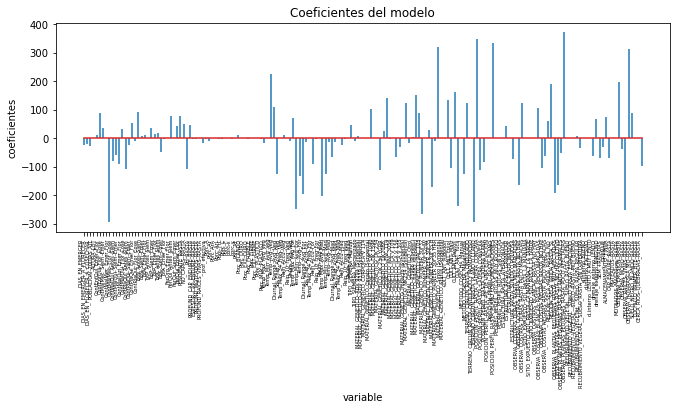

In [48]:
fig, ax = plt.subplots(figsize=(11, 3.84))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=5)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');

### Mejores parametros encontrados.
* alpha: 0.1
* li_ratio:0.97


# IMPLMENTACIÓN DEL ENFOQUE CLUSTERWISE

## FASE #1 : Distribución de los datos

In [42]:
# Variables de entrada
# Dataset
DataSet = df_final.copy()
# Minimo numero de registros que debe tener cada grupo aceptado  | Criterio del 10% de registros aceptados
MinimoRegistros = 80
# Error promedio aceptado de los grupos , permite seleccionar los grupos que mas se ajusten al modelo de RL
# Valor obtenido del proceso de ajuste con CV utilizando el regresor ridge
#ErrorPromedioAceptado = 658.08
# Valor de tolerancia al error c/d vez que se crea el siguiente grupo | puede ser un grilla de diferentes valores a tolerar
ErrorPromedioAdicional = 50
# Coeficiente de correlación minimo aceptado por c/d grupo
CoeficienteCorrelacionMinimo = 0.88
# Lista de grupos aceptados
GruposAceptados = []
# Modelos aceptados x c/d grupo con sus atributos y valores de correlación
modelosAceptados = []
# Registros huerfanos que no fueron aceptados en ningun grupo
huerfanos = []
# Maximo valor de MAR permitido para conformar cada grupo
MAE_Permitido = 45



In [44]:
# Calcular modelo de regresion lineal para todo el datset.
# Antes de entrar a la funcion asegurase que se a realizo la respectiva transformacion, codificacion , normalización de la data.
def calcularModeloRegresionLineal(DataSet):
    # Division de los datos
    # Variables dependientes | independiente
    Y = DataSet.RDT_AJUSTADO
    X = DataSet.drop(["RDT_AJUSTADO","ID_LOTE"], axis=1)
    # Se define el modelo de regresion con ElasticNet | o el mejor regresor seleccionado.
    # Se realiza la implmentacion del regresor ElasticNet (alpha=0.1, l1_ratio=0.97) con la mejor configuracion seleccionada.
    modelElasticNet = ElasticNet(alpha=0.1, l1_ratio=0.97)
    # fit model
    model = modelElasticNet.fit(X,Y)
    # Obtengo el ajuste del modelo
    r_2 = model.score(X,Y)
    # guradan los datos en un exel
    
    #print(r_2)
    # Retorna del modelo y el coeficiente de determinacion del modelo
    return [model, r_2]


In [45]:
# Funcion para ordenar los datos deacuerdo al error de predicción
# Entrada: Dataset, modelo, errorPromedioAceptado
# Salida: Dataset ordenado
def OrdenarDatosPorErrorDePrediccion(Dataset, model):
    # Se dividen los datos
    # X:  Variables independendientes
    # Y:  Variables dependientes.
    Y = Dataset.RDT_AJUSTADO
    X = Dataset.drop(["RDT_AJUSTADO","ID_LOTE"], axis=1)
    # Se realizan las predicciones del modelo
    yhat = model.predict(X)
    Dataset["Yhat"] = pd.Series(yhat)
    # Calculo del error absoluto para ca/d registro
    Dataset["EA"] = abs(Dataset.RDT_AJUSTADO - Dataset.Yhat)
    # Se calcula la columa para el error promomedio aceptado
    #Dataset["EPA"] = calcularErroPromedioAceptado(Dataset)
    # Se ordena los registros de [menor a mayor] , tomando referencia el valor absoluto
    DataSetOrdenado = Dataset.sort_values(by=['EA'],ascending=True)
    #DataSetOrdenado["EPA"] = calcularErroPromedioAceptado(DataSetOrdenado)
    
    # Se retorna el datset ordenado
    return  DataSetOrdenado 
    

In [30]:
mr1, r_2 = calcularModeloRegresionLineal(DataSet)
print("El ajuste del modelo es: ", r_2)

El ajuste del modelo es:  0.7420467584701328


C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.906e+07, tolerance: 1.533e+05
  model = cd_fast.enet_coordinate_descent(


In [46]:
def calcularErroPromedioAceptado(DataSet):
    EPA = 0
    Acumulador = 0
    ErrorPromedioAceptado = []
    for i in range(len(DataSet)):
        #print("Iteracion: ", i)
        Acumulador = Acumulador + DataSet.loc[i].EA
        EPA = Acumulador/(i+1)
        #print("Error: ", EPA)
        #ErrorPromedioAceptado.insert(DataSet.index[i], EPA)
        ErrorPromedioAceptado.append(EPA)
    
    serie = pd.Series(ErrorPromedioAceptado)
    return serie


In [32]:
DataSet

,ID_LOTE,DIAS_EN_EMERGER,DIAS_EN_EMERGER_A_FLORECER,DIAS_EN_FLORECER_A_COSECHAR,POBLACION_20DIAS_AJT,ALTURA_LOT,ContEnfQui_Emer_Flor,ContEnfQui_Flor_Cose,ContMalMec_Siem_Emer,ContMalMec_Emer_Flor,...,CAP_ENDURE_RASTA,MOTEADOS_RASTA,MOTEADOS_MAS70cm._RASTA,OBSERVA_EROSION_RASTA,OBSERVA_MOHO_RASTA,OBSERVA_RAICES_VIVAS_RASTA,OBSERVA_HOJARASCA_MO_RASTA,SUELO_NEGRO_BLANDO_RASTA,CUCHILLO_PRIMER_HTE_RASTA,CERCA_RIOS_QUEBRADAS_RASTA
0,40,5,63,68,60000,13,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
1,43,5,64,63,60000,15,0,0,0,0,...,1,1,0,0,0,0,1,0,1,0
2,44,5,59,66,60000,12,0,0,0,0,...,1,1,0,0,0,1,1,0,1,0
3,45,5,64,59,60000,12,0,0,0,0,...,1,1,0,0,0,0,1,0,0,0
4,46,5,63,60,60000,16,0,0,0,0,...,1,1,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
794,4378,7,47,84,70000,18,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
795,4379,5,47,81,62000,16,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
796,4380,6,49,79,61000,17,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
797,4382,7,48,95,65000,17,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0


In [34]:
datasetOrd = OrdenarDatosPorErrorDePrediccion(DataSet,mr1)

In [43]:
datasetOrdenado = datasetOrd.reset_index()

In [36]:
# Guardamos el dataset ordenado en un archivo excel
datasetOrdenado.reset_index().to_excel("../Archivos Generados/Dataset_ordendo_MAE.xlsx")

In [47]:
# FUncion que permite crear el grupo con las mejores intancias que cumplan con lso criterios de aceptacion.
# - Mejor error absoluto
# - Numero de registros aceptado x grupo
def CrearGrupo(DataSetOrdenado):
    RegistrosAceptados = []
    for x in range(len(DataSetOrdenado)):
        if DataSetOrdenado.loc[x].EA <= DataSetOrdenado.loc[x].EPA:
            RegistrosAceptados.append(DataSetOrdenado.loc[x])

        else:
            print("Entra aqui")
            #break
    
    # Registros que conforman n-grupos
    # Cada Grupo va ser un sub-dataset 
    return RegistrosAceptados

In [38]:
datasetOrdenado

,index,ID_LOTE,DIAS_EN_EMERGER,DIAS_EN_EMERGER_A_FLORECER,DIAS_EN_FLORECER_A_COSECHAR,POBLACION_20DIAS_AJT,ALTURA_LOT,ContEnfQui_Emer_Flor,ContEnfQui_Flor_Cose,ContMalMec_Siem_Emer,...,MOTEADOS_MAS70cm._RASTA,OBSERVA_EROSION_RASTA,OBSERVA_MOHO_RASTA,OBSERVA_RAICES_VIVAS_RASTA,OBSERVA_HOJARASCA_MO_RASTA,SUELO_NEGRO_BLANDO_RASTA,CUCHILLO_PRIMER_HTE_RASTA,CERCA_RIOS_QUEBRADAS_RASTA,Yhat,EA
0,326,2481,6,45,77,54000,11,0,0,0,...,0,0,0,1,0,0,1,0,3814.016187,0.066187
1,384,2660,5,54,80,60000,10,0,0,0,...,0,0,0,1,0,0,1,0,3999.873805,0.126195
2,480,3018,4,48,82,55000,12,1,0,0,...,0,0,0,1,0,0,1,0,4957.922153,0.217847
3,311,2450,5,47,73,70000,72,1,0,0,...,0,0,0,1,0,0,1,0,4409.618652,0.318652
4,319,2465,5,47,81,67000,14,1,0,0,...,0,0,0,1,1,0,1,0,4836.308171,1.428171
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
794,527,3631,4,46,85,65000,5,0,0,0,...,0,0,0,1,0,0,1,1,4918.171657,2280.961657
795,462,2950,4,47,87,55000,4,0,0,0,...,0,0,0,1,0,0,1,0,3663.760456,2505.620456
796,170,1985,5,46,76,75000,7,0,0,0,...,0,0,0,1,1,0,1,1,3791.248565,2520.841435
797,360,2612,6,40,82,72000,18,0,0,0,...,0,0,0,1,0,0,0,0,4205.234021,2530.814021


In [45]:
DataSetOrdenado = calcularMAE(datasetOrdenado)

In [46]:
DataSetOrdenado.to_excel("../Archivos Generados/MAE.xlsx")

In [53]:
DataSetOrdenado.RDT_AJUSTADO

0      3813.95
1      4000.00
2      4958.14
3      4409.30
4      4834.88
        ...   
794    2637.21
795    1158.14
796    6312.09
797    1674.42
798    1032.56
Name: RDT_AJUSTADO, Length: 799, dtype: float64

In [51]:
# FUncion que permite crear el grupo con las mejores intancias que cumplan con lso criterios de aceptacion.
# - Mejor error absoluto
# - Numero de registros aceptado x grupo
# crear el grupo
Selected = datasetOrdenado.loc[datasetOrdenado.EPA < MAE_Permitido]

In [48]:
def LimpiezaColumnasDataframe(DataFrameGrupo):
    # Se eliminan algunas variables del Grupo 
    varEliminar = ["Yhat","EA"]
    DataFrameGrupo = DataFrameGrupo.drop(varEliminar,axis=1)
    # Se retorna el grupo
    return DataFrameGrupo
    
    

In [49]:
def EliminarRegistrosGrupo(Grupo):
    # Borrar del datset original las observaciones seleccionadas en cada grupo
    #indexEliminar = list(Grupo.index)
    indexEliminar = list(Grupo["index"])
    #print("Longitud Dataset Original")
    df_nuevo = DataSet[DataSet.index.isin(indexEliminar)== False]
    # Se retorna el
    return df_nuevo
    

In [50]:
# Funcion para calcular el MAE de cada registro
def calcularMAE(dataset):
    dataset["EPA"] = calcularErroPromedioAceptado(dataset)
    return dataset

In [56]:
DataSetOr

,ID_LOTE,DIAS_EN_EMERGER,DIAS_EN_EMERGER_A_FLORECER,DIAS_EN_FLORECER_A_COSECHAR,POBLACION_20DIAS_AJT,ALTURA_LOT,ContEnfQui_Emer_Flor,ContEnfQui_Flor_Cose,ContMalMec_Siem_Emer,ContMalMec_Emer_Flor,...,MOTEADOS_MAS70cm._RASTA,OBSERVA_EROSION_RASTA,OBSERVA_MOHO_RASTA,OBSERVA_RAICES_VIVAS_RASTA,OBSERVA_HOJARASCA_MO_RASTA,SUELO_NEGRO_BLANDO_RASTA,CUCHILLO_PRIMER_HTE_RASTA,CERCA_RIOS_QUEBRADAS_RASTA,Yhat,EA
739,4271,5,48,81,66700,17,0,0,0,0,...,0,0,0,1,1,0,0,0,6434.814337,1.235663
741,4273,6,49,84,65750,17,0,0,0,0,...,0,0,0,1,0,0,0,0,6308.597816,1.872184
236,2201,3,50,78,55000,9,0,0,0,0,...,0,0,0,1,0,0,1,0,4235.225911,3.144089
37,672,7,39,113,64000,14,0,0,0,0,...,0,0,0,1,0,0,0,0,5003.180563,3.180563
93,1820,3,46,88,70000,10,0,0,0,0,...,1,0,0,1,1,0,1,1,3716.079239,4.850761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359,2611,6,44,81,58000,18,1,0,0,0,...,0,0,0,1,0,0,0,0,4087.101658,2186.158342
462,2950,4,47,87,55000,4,0,0,0,0,...,0,0,0,1,0,0,1,0,3593.670704,2435.530704
360,2612,6,40,82,72000,18,0,0,0,0,...,0,0,0,1,0,0,0,0,4117.965836,2443.545836
99,1827,4,49,70,70000,12,0,0,0,0,...,0,0,0,1,1,0,1,1,3539.666856,2507.106856


In [51]:
# Implementacion del Algoritmo.
contador = 0
while(len(DataSet) != 0):
    contador = contador+1
    print(DataSet)
    # 1. Calcular modelo de regresion dataset completo.
    modelrr, cd_r = calcularModeloRegresionLineal(DataSet)
    # 2. Seleccion de las mejores intancias (Dataset Ordenado)
    DataSetOr = OrdenarDatosPorErrorDePrediccion(DataSet, modelrr)
    datasetOrdenado = DataSetOr.reset_index()
    print("Ordenado: ",datasetOrdenado)
    # 3. Calculo del MAE
    DatasetOrdenado = calcularMAE(datasetOrdenado)
    print("MAE", DatasetOrdenado)
    # 3. Crear Grupo con las mejores instancias.
    grupo = DatasetOrdenado.loc[DatasetOrdenado.EPA < MAE_Permitido]
    print(len(grupo))
    #print("Cantidad de registros por grupo: ",Grupo.shape)
    if (len(grupo) > MinimoRegistros):
        # 4. Eliminar variables 
        Grupo = LimpiezaColumnasDataframe(grupo)
        DataSet = LimpiezaColumnasDataframe(DataSet)
        #print("Cantidad registos aceptados: ", Grupo.shape)
        #print("Longitud Dataset Original 3: ", DataSet.shape)
        # 5. Calculamos modelo de regresion Lineal para el grupo
        ModeloGrupo, R_2 = calcularModeloRegresionLineal(Grupo)
        # 6. Se evalua las condiciones del Coef Determinacion
        if (R_2 > CoeficienteCorrelacionMinimo):
            # 7. Se agregan el grupo y el modelo a las respectivas listas
            GruposAceptados.append(Grupo)
            modelosAceptados.append(ModeloGrupo)
            Grupo.to_excel(f"../Archivos Generados/Grupo{contador}.xlsx")
            # 8. Se Eliminan las instancias del df original para la proxim
            # a iteracion
            DataSet = EliminarRegistrosGrupo(Grupo)
            # 9. Se adiciona el error promedio aceptado.
            MAE_Permitido= MAE_Permitido + ErrorPromedioAdicional
    else:
        # Salir del bucle
        Huerfanos = DataSet
        print("Logitud Huerfanos: ", Huerfanos.shape)
        Huerfanos.to_excel("../Archivos Generados/Huerfanos.xlsx")
        break


     ID_LOTE  DIAS_EN_EMERGER  DIAS_EN_EMERGER_A_FLORECER  \
0         40                5                          63   
1         43                5                          64   
2         44                5                          59   
3         45                5                          64   
4         46                5                          63   
..       ...              ...                         ...   
794     4378                7                          47   
795     4379                5                          47   
796     4380                6                          49   
797     4382                7                          48   
798     4432                4                          49   

     DIAS_EN_FLORECER_A_COSECHAR  POBLACION_20DIAS_AJT  ALTURA_LOT  \
0                             68                 60000          13   
1                             63                 60000          15   
2                             66                 60000   

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.906e+07, tolerance: 1.533e+05
  model = cd_fast.enet_coordinate_descent(


Ordenado:       index  ID_LOTE  DIAS_EN_EMERGER  DIAS_EN_EMERGER_A_FLORECER  \
0      326     2481                6                          45   
1      384     2660                5                          54   
2      480     3018                4                          48   
3      311     2450                5                          47   
4      319     2465                5                          47   
..     ...      ...              ...                         ...   
794    527     3631                4                          46   
795    462     2950                4                          47   
796    170     1985                5                          46   
797    360     2612                6                          40   
798     99     1827                4                          49   

     DIAS_EN_FLORECER_A_COSECHAR  POBLACION_20DIAS_AJT  ALTURA_LOT  \
0                             77                 54000          11   
1                             80

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.715e+05, tolerance: 7.284e+03
  model = cd_fast.enet_coordinate_descent(


     ID_LOTE  DIAS_EN_EMERGER  DIAS_EN_EMERGER_A_FLORECER  \
0         40                5                          63   
3         45                5                          64   
4         46                5                          63   
6         51                5                          47   
7        268                5                          42   
..       ...              ...                         ...   
794     4378                7                          47   
795     4379                5                          47   
796     4380                6                          49   
797     4382                7                          48   
798     4432                4                          49   

     DIAS_EN_FLORECER_A_COSECHAR  POBLACION_20DIAS_AJT  ALTURA_LOT  \
0                             68                 60000          13   
3                             59                 60000          12   
4                             60                 60000   

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.769e+07, tolerance: 1.459e+05
  model = cd_fast.enet_coordinate_descent(


MAE      index  ID_LOTE  DIAS_EN_EMERGER  DIAS_EN_EMERGER_A_FLORECER  \
0      615     3943                3                          48   
1       17      469                5                          50   
2      425     2908                5                          46   
3      572     3739                4                          47   
4      334     2490                6                          40   
..     ...      ...              ...                         ...   
712    794     4378                7                          47   
713    795     4379                5                          47   
714    796     4380                6                          49   
715    797     4382                7                          48   
716    798     4432                4                          49   

     DIAS_EN_FLORECER_A_COSECHAR  POBLACION_20DIAS_AJT  ALTURA_LOT  \
0                             79                 63000           6   
1                             70       

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.408e+06, tolerance: 1.026e+04
  model = cd_fast.enet_coordinate_descent(


     ID_LOTE  DIAS_EN_EMERGER  DIAS_EN_EMERGER_A_FLORECER  \
7        268                5                          42   
8        269                6                          42   
9        270                5                          56   
10       271                6                          56   
11       272                5                          43   
..       ...              ...                         ...   
794     4378                7                          47   
795     4379                5                          47   
796     4380                6                          49   
797     4382                7                          48   
798     4432                4                          49   

     DIAS_EN_FLORECER_A_COSECHAR  POBLACION_20DIAS_AJT  ALTURA_LOT  \
7                             89                 60000          12   
8                             86                 60000           9   
9                             71                 60000   

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.116e+07, tolerance: 1.355e+05
  model = cd_fast.enet_coordinate_descent(


MAE      index  ID_LOTE  DIAS_EN_EMERGER  DIAS_EN_EMERGER_A_FLORECER  \
0      592     3830                5                          46   
1      329     2484                5                          45   
2       69     1555                6                          42   
3      251     2216                4                          47   
4      189     2032                3                          45   
..     ...      ...              ...                         ...   
628    794     4378                7                          47   
629    795     4379                5                          47   
630    796     4380                6                          49   
631    797     4382                7                          48   
632    798     4432                4                          49   

     DIAS_EN_FLORECER_A_COSECHAR  POBLACION_20DIAS_AJT  ALTURA_LOT  \
0                             88                 74000           8   
1                             88       

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.850e+05, tolerance: 8.809e+03
  model = cd_fast.enet_coordinate_descent(


     ID_LOTE  DIAS_EN_EMERGER  DIAS_EN_EMERGER_A_FLORECER  \
7        268                5                          42   
8        269                6                          42   
10       271                6                          56   
11       272                5                          43   
12       273                5                          58   
..       ...              ...                         ...   
794     4378                7                          47   
795     4379                5                          47   
796     4380                6                          49   
797     4382                7                          48   
798     4432                4                          49   

     DIAS_EN_FLORECER_A_COSECHAR  POBLACION_20DIAS_AJT  ALTURA_LOT  \
7                             89                 60000          12   
8                             86                 60000           9   
10                            72                 60000   

C:\Users\German\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.002e+07, tolerance: 1.266e+05
  model = cd_fast.enet_coordinate_descent(


MAE      index  ID_LOTE  DIAS_EN_EMERGER  DIAS_EN_EMERGER_A_FLORECER  \
0      134     1919                5                          51   
1      166     1980                5                          47   
2      159     1961                4                          48   
3      316     2460                6                          45   
4      504     3053                4                          47   
..     ...      ...              ...                         ...   
541    794     4378                7                          47   
542    795     4379                5                          47   
543    796     4380                6                          49   
544    797     4382                7                          48   
545    798     4432                4                          49   

     DIAS_EN_FLORECER_A_COSECHAR  POBLACION_20DIAS_AJT  ALTURA_LOT  \
0                             72                 75000          10   
1                             68       

In [54]:
# se determina las caracteristicas asociadas a cada modelo
CoefG = pd.DataFrame()
CoefG["Columns"] = X_train.columns
CoefG['Coefficientes G1'] = pd.Series(modelosAceptados[0].coef_)
CoefG['Coefficientes G2'] = pd.Series(modelosAceptados[1].coef_)
CoefG['Coefficientes G3'] = pd.Series(modelosAceptados[2].coef_)
CoefG.to_excel("../Archivos Generados/CoeficientesGrupos.xlsx")

In [53]:
modelosAceptados

[ElasticNet(alpha=0.1, l1_ratio=0.97),
 ElasticNet(alpha=0.1, l1_ratio=0.97),
 ElasticNet(alpha=0.1, l1_ratio=0.97)]

In [56]:
len(modelosAceptados[0].feature_names_in_)

176

<te>